Importing Libraries

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn import neighbors
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras

Importing Dataset

In [5]:
from google.colab import files
files.upload()

Saving books.csv to books.csv
Saving ratings.csv to ratings.csv


{'books.csv': b'id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,title,language_code,average_rating,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url\r\n1,2767052,2767052,2792775,272,439023483,9.78043902348e+12,Suzanne Collins,2008.0,The Hunger Games,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m/2767052.jpg,https://images.gr-assets.com/books/1447303603s/2767052.jpg\r\n2,3,3,4640799,491,439554934,9.78043955493e+12,"J.K. Rowling, Mary GrandPr\xc3\xa9",1997.0,Harry Potter and the Philosopher\'s Stone,"Harry Potter and the Sorcerer\'s Stone (Harry Potter, #1)",eng,4.44,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m/3.jpg,https://images.gr-assets.com/books/1474154022s/3.jpg\r\n3,41865,418

In [6]:
book = pd.read_csv('books.csv',error_bad_lines=False)
rating = pd.read_csv('ratings.csv',error_bad_lines=False)
book.head()

,id,book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,title,language_code,average_rating,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,"The Hunger Games (The Hunger Games, #1)",eng,4.34,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,Harry Potter and the Sorcerer's Stone (Harry P...,eng,4.44,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
2,3,41865,41865,3212258,226,316015849,9.780316e+12,Stephenie Meyer,2005.0,Twilight,"Twilight (Twilight, #1)",en-US,3.57,3866839,3916824,95009,456191,436802,793319,875073,1355439,https://images.gr-assets.com/books/1361039443m...,https://images.gr-assets.com/books/1361039443s...
3,4,2657,2657,3275794,487,61120081,9.780061e+12,Harper Lee,1960.0,To Kill a Mockingbird,To Kill a Mockingbird,eng,4.25,3198671,3340896,72586,60427,117415,446835,1001952,1714267,https://images.gr-assets.com/books/1361975680m...,https://images.gr-assets.com/books/1361975680s...
4,5,4671,4671,245494,1356,743273567,9.780743e+12,F. Scott Fitzgerald,1925.0,The Great Gatsby,The Great Gatsby,eng,3.89,2683664,2773745,51992,86236,197621,606158,936012,947718,https://images.gr-assets.com/books/1490528560m...,https://images.gr-assets.com/books/1490528560s...


In [7]:
rating.head()

,book_id,user_id,rating
0,1,314,5
1,1,439,3
2,1,588,5
3,1,1169,4
4,1,1185,4


Dataset Analysis

In [8]:
book.isnull().sum()

id                              0
book_id                         0
best_book_id                    0
work_id                         0
books_count                     0
isbn                          700
isbn13                        585
authors                         0
original_publication_year      21
original_title                585
title                           0
language_code                1084
average_rating                  0
ratings_count                   0
work_ratings_count              0
work_text_reviews_count         0
ratings_1                       0
ratings_2                       0
ratings_3                       0
ratings_4                       0
ratings_5                       0
image_url                       0
small_image_url                 0
dtype: int64

In [9]:
print(rating.isnull().sum())

book_id    0
user_id    0
rating     0
dtype: int64


In [10]:
print(book.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         10000 non-null  int64  
 1   book_id                    10000 non-null  int64  
 2   best_book_id               10000 non-null  int64  
 3   work_id                    10000 non-null  int64  
 4   books_count                10000 non-null  int64  
 5   isbn                       9300 non-null   object 
 6   isbn13                     9415 non-null   float64
 7   authors                    10000 non-null  object 
 8   original_publication_year  9979 non-null   float64
 9   original_title             9415 non-null   object 
 10  title                      10000 non-null  object 
 11  language_code              8916 non-null   object 
 12  average_rating             10000 non-null  float64
 13  ratings_count              10000 non-null  int6

In [11]:
uniq_userId = rating.user_id.nunique()
uniq_bookId = rating.book_id.nunique()
print("{} {}".format("Number of Users:", uniq_userId))
print("{} {}".format("Number of Total Books:", uniq_bookId))
print("{} {}".format("Total Count of Ratings/Reviews:", rating.shape[0]))


Number of Users: 53424
Number of Total Books: 10000
Total Count of Ratings/Reviews: 981756


Splitting Train and Test Sets

In [12]:
X_train,X_test = train_test_split(rating, test_size = 0.2, random_state = 1)
print(f"Size of train data: {X_train.shape[0]}")
print(f"Size of test data: {X_test.shape[0]}")

Size of train data: 785404
Size of test data: 196352


Embedding layer Using Keras Functional Layers API

Book Input Network

In [13]:
book_input = keras.Input(shape = [1])
book_embedded = tf.keras.layers.Embedding(uniq_bookId+1,32)(book_input)
book_output = tf.keras.layers.Flatten()(book_embedded)

User Input Network

In [25]:
user_input = tf.keras.Input(shape = [1])
user_embedded = tf.keras.layers.Embedding(uniq_userId+1,32)(user_input)
user_output = tf.keras.layers.Flatten()(user_embedded)

In [26]:
concatenate_layers = tf.keras.layers.Concatenate()([book_output,user_output])
x = tf.keras.layers.Dense(150)(concatenate_layers)
x = tf.keras.layers.LayerNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Activation('relu')(x)

x = tf.keras.layers.Dense(32)(x)
x = tf.keras.layers.LayerNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Activation('relu')(x)


x = tf.keras.layers.Dense(10)(x)
x = tf.keras.layers.LayerNormalization()(x)
x = tf.keras.layers.Dropout(0.5)(x)
x = tf.keras.layers.Activation('relu')(x)


x_output = tf.keras.layers.Dense(1, activation = 'relu')(x)
model = tf.keras.Model([book_input,user_input],x_output)

In [27]:
model.compile(optimizer = tf.optimizers.Adam(learning_rate=0.001), loss = 'mean_squared_error')
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 input_3 (InputLayer)           [(None, 1)]          0           []                               
                                                                                                  
 embedding (Embedding)          (None, 1, 32)        320032      ['input_1[0][0]']                
                                                                                                  
 embedding_2 (Embedding)        (None, 1, 32)        1709600     ['input_3[0][0]']                
                                                                                            

Loss curves

In [28]:
hist = model.fit([X_train.book_id, X_train.user_id], X_train.rating, batch_size= 128, epochs=10, verbose=1, validation_data=([X_test.book_id, X_test.user_id], X_test.rating))

Epoch 1/10
6136/6136 [==============================] - 161s 26ms/step - loss: 1.7073 - val_loss: 0.7473
Epoch 2/10
6136/6136 [==============================] - 159s 26ms/step - loss: 0.7575 - val_loss: 0.7188
Epoch 3/10
6136/6136 [==============================] - 158s 26ms/step - loss: 0.7157 - val_loss: 0.7097
Epoch 4/10
6136/6136 [==============================] - 160s 26ms/step - loss: 0.6893 - val_loss: 0.7059
Epoch 5/10
6136/6136 [==============================] - 163s 27ms/step - loss: 0.6704 - val_loss: 0.7063
Epoch 6/10
6136/6136 [==============================] - 165s 27ms/step - loss: 0.6547 - val_loss: 0.7082
Epoch 7/10
6136/6136 [==============================] - 161s 26ms/step - loss: 0.6409 - val_loss: 0.7088
Epoch 8/10
6136/6136 [==============================] - 161s 26ms/step - loss: 0.6270 - val_loss: 0.7141
Epoch 9/10
6136/6136 [==============================] - 161s 26ms/step - loss: 0.6144 - val_loss: 0.7153
Epoch 10/10
6136/6136 [==============================] 

Plotting Losses

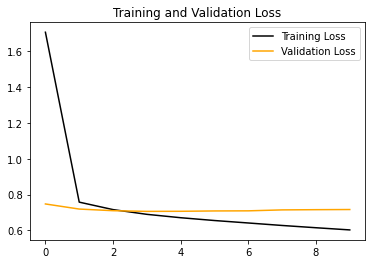

In [29]:
training_loss = hist.history['loss']
val_loss = hist.history['val_loss']
plt.plot(training_loss, color='black', label='Training Loss')
plt.plot(val_loss, color='orange', label='Validation Loss')
plt.title("Training and Validation Loss")
plt.legend()
plt.show()

Saving the Model

In [30]:
model.save('model')

INFO:tensorflow:Assets written to: model/assets


Prediction for Book Ids

In [31]:
p = int(input('Enter the Number of User To get Book Recomendation : '))
bId = list(rating.book_id.unique())
bId.remove(10000)
book_arr = np.array(bId)
user = np.array([p for i in range(len(bId))])
pred = model.predict([book_arr, user])
print("Ratings Predicted for User "+ str(p)+":")
print(pred)
pred = pred.reshape(-1)
pred_ids = (-pred).argsort()[0:5]
print("IDs of Recommended Books for User "+ str(p)+":")
print(pred_ids)

Enter the Number of User To get Book Recomendation : 56
Ratings Predicted for User 56:
[[4.41943  ]
 [4.2886605]
 [3.6416724]
 ...
 [4.194796 ]
 [4.005518 ]
 [4.359018 ]]
IDs of Recommended Books for User 56:
[6360 8977 9565 5579 6589]


Retrieving Corrosponding Books

In [33]:
recomendation = book.iloc[pred_ids]
book_recomm = recomendation[["book_id", "title", "authors","average_rating", "image_url"]]
book_recomm = book_recomm.sort_values('average_rating')
book_recomm.head()

,book_id,title,authors,average_rating,image_url
5579,24494,The Calvin and Hobbes Lazy Sunday Book,Bill Watterson,4.66,https://s.gr-assets.com/assets/nophoto/book/11...
8977,121792,The Revenge of the Baby-Sat,Bill Watterson,4.71,https://images.gr-assets.com/books/1384734025m...
9565,70487,Attack of the Deranged Mutant Killer Monster S...,Bill Watterson,4.72,https://images.gr-assets.com/books/1384735429m...
6589,59715,The Authoritative Calvin and Hobbes: A Calvin ...,Bill Watterson,4.73,https://images.gr-assets.com/books/1391114055m...
6360,70489,There's Treasure Everywhere: A Calvin and Hobb...,Bill Watterson,4.74,https://s.gr-assets.com/assets/nophoto/book/11...
